# ChromVAR scores of marker peaks

In [1]:
here::i_am("atac/archR/dimensionality_reduction/cells/archR_dimensionality_reduction.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
      

In [2]:
io$metax

NULL

In [3]:
args = list()
args$metadata = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update_PeakClusters.txt.gz'
args$marker_peaks = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/atac/archR/differential/metacells/celltype/PeakMatrix/markers/PeakMatrix_markers_filt.txt.gz'

### Read ArchR Object

In [4]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE] 

In [5]:
########################
## Load ArchR project ##
########################

source(here::here("atac/archR/load_archR_project.R"))

# Subset
ArchRProject.filt <- ArchRProject[sample_metadata$cell]

Setting default genome to Mm10.

Setting default number of Parallel threads to 1.

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\__

### Read markers

In [6]:
markers = fread(args$marker_peaks) %>% 
    .[order(-score)]# %>%
    #.[,head(.SD, 2000), by=celltype]

In [7]:
markers.gr = lapply(unique(markers$celltype), function(x){
    features = markers[celltype==x, feature]
    gr <- GRanges(
    seqnames = Rle(str_split(features, ':') %>% map_chr(1)),
    ranges = IRanges(as.numeric(str_split(str_split(features, ':') %>% map_chr(2), '-') %>% map_chr(1)),
                    as.numeric(str_split(str_split(features, ':') %>% map_chr(2), '-') %>% map_chr(2))))
    return(gr)
})
names(markers.gr) = unique(markers$celltype)

In [8]:
ArchRProject.filt <- addPeakAnnotations(ArchRProj = ArchRProject.filt, regions = markers.gr, name = "MarkerPeaks", force=TRUE)

ArchR logging to : ArchRLogs/ArchR-addPeakAnnotations-8cda64e181693-Date-2023-02-22_Time-10-52-37.log
If there is an issue, please report to github with logFile!

2023-02-22 10:52:40 : Creating Peak Overlap Matrix, 0.046 mins elapsed.

2023-02-22 10:52:40 : All Regions Overlap at least 1 peak!, 0.051 mins elapsed.



In [9]:
ArchRProject.filt@peakAnnotation$MarkerPeaks

$Name
[1] "MarkerPeaks"

$Positions
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/MarkerPeaks-Positions-In-Peaks.rds"

$Matches
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/MarkerPeaks-Matches-In-Peaks.rds"

In [10]:
test = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/MarkerPeaks-Matches-In-Peaks.rds')

In [11]:
addArchRThreads(16)

Setting default number of Parallel threads to 16.



In [12]:
ArchRProject.filt <- addDeviationsMatrix(
  ArchRProj = ArchRProject.filt, 
  peakAnnotation = "MarkerPeaks",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-8cda643d63a50-Date-2023-02-22_Time-10-52-42.log
If there is an issue, please report to github with logFile!



NULL


as(<lgCMatrix>, "dgCMatrix") is deprecated since Matrix 1.5-0; do as(., "dMatrix") instead

2023-02-22 10:53:24 : Batch Execution w/ safelapply!, 0 mins elapsed.

###########
2023-02-22 10:57:14 : Completed Computing Deviations!, 4.524 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-addDeviationsMatrix-8cda643d63a50-Date-2023-02-22_Time-10-52-42.log



In [13]:
test = getMatrixFromProject(
  ArchRProj = ArchRProject.filt,
  useMatrix = "MarkerPeaksMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-8cda63930fe66-Date-2023-02-22_Time-10-57-15.log
If there is an issue, please report to github with logFile!

2023-02-22 10:57:26 : Organizing colData, 0.183 mins elapsed.

2023-02-22 10:57:26 : Organizing rowData, 0.194 mins elapsed.

2023-02-22 10:57:26 : Organizing rowRanges, 0.194 mins elapsed.

2023-02-22 10:57:26 : Organizing Assays (1 of 2), 0.194 mins elapsed.

2023-02-22 10:57:26 : Organizing Assays (2 of 2), 0.197 mins elapsed.

2023-02-22 10:57:27 : Constructing SummarizedExperiment, 0.199 mins elapsed.

2023-02-22 10:57:27 : Finished Matrix Creation, 0.212 mins elapsed.



In [14]:
MarkerPeaks_score = as.data.table(as.matrix(t(test@assays@data$z)), keep.rownames=T) %>% setnames('rn', 'cell')

In [15]:
umap = fread(sprintf('%s/results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz', io$basedir))

In [16]:
plot = merge(umap, MarkerPeaks_score, by='cell')

In [17]:
plots = lapply(colnames(plot[,-c('cell', 'UMAP1', 'UMAP2')]), function(x){
    plot = plot[order(plot[[x]])]
    plot = ggplot(plot, aes_string('UMAP1', 'UMAP2', col=x)) +
        geom_point(size=0.7) +
        scale_color_gradient(low='gray90', high='darkblue', name='score') +
        ggtitle(x) + 
        theme_void() + theme(text=element_text(size=15))
})

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


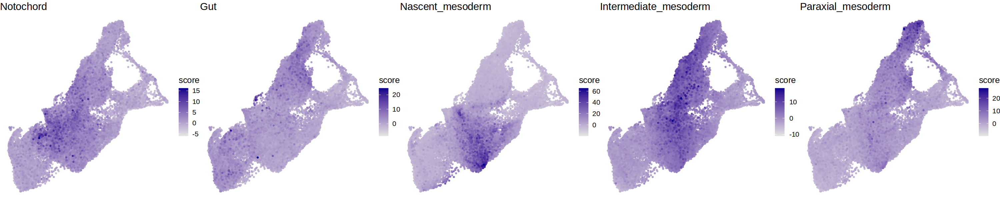

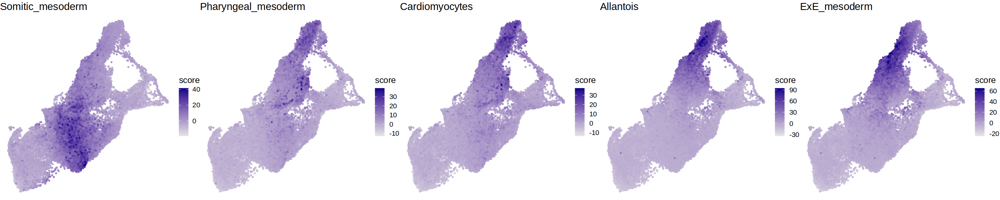

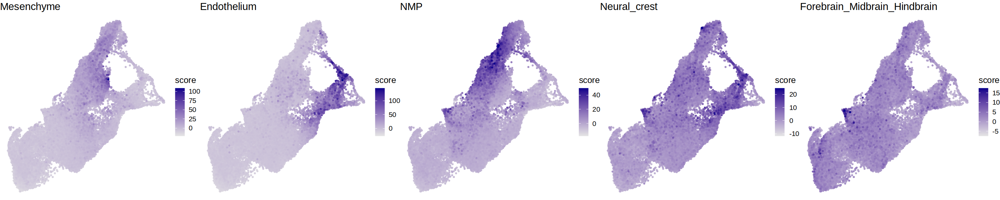

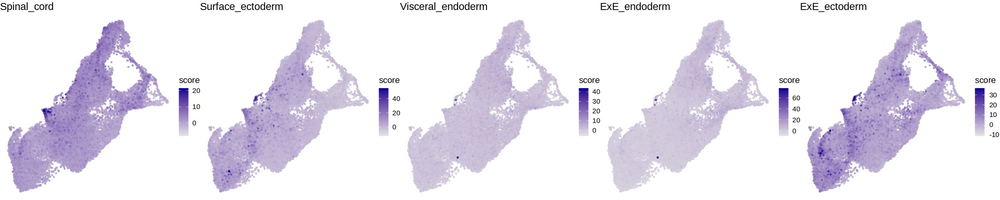

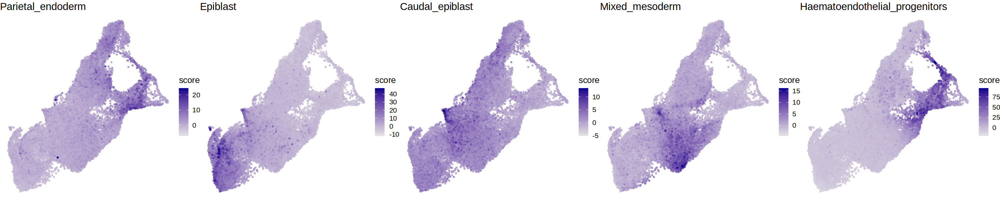

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

attr(,"class")
[1] "list"      "ggarrange"

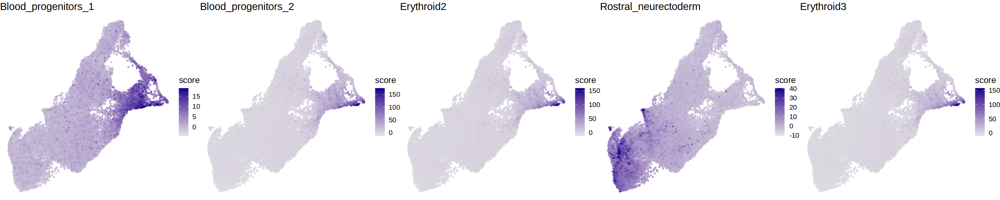

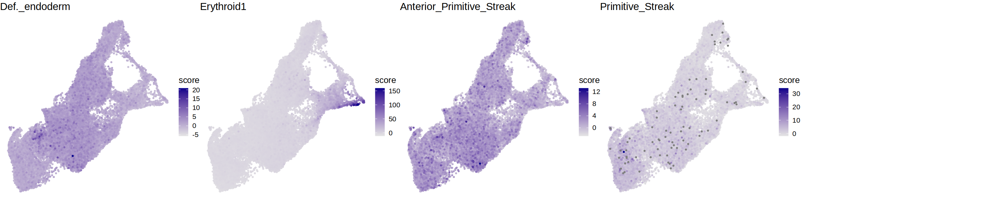

In [18]:
options(repr.plot.width=25, repr.plot.height=5)
ggarrange(plotlist=plots, ncol=5)

# by difference instead of markers

In [105]:
markers = fread(args$marker_peaks) %>% 
    .[order(-diff)] %>%
    .[,head(.SD, 2000), by=celltype]

In [106]:
markers.gr = lapply(unique(markers$celltype), function(x){
    features = markers[celltype==x, feature]
    gr <- GRanges(
    seqnames = Rle(str_split(features, ':') %>% map_chr(1)),
    ranges = IRanges(as.numeric(str_split(str_split(features, ':') %>% map_chr(2), '-') %>% map_chr(1)),
                    as.numeric(str_split(str_split(features, ':') %>% map_chr(2), '-') %>% map_chr(2))))
    return(gr)
})
names(markers.gr) = unique(markers$celltype)

In [107]:
ArchRProject.filt <- addPeakAnnotations(ArchRProj = ArchRProject.filt, regions = markers.gr, name = "MarkerPeaks", force=TRUE)

ArchR logging to : ArchRLogs/ArchR-addPeakAnnotations-f54285c546fe2-Date-2023-02-20_Time-17-17-46.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2023-02-20 17:17:49 : 

2023-02-20 17:17:50 : Creating Peak Overlap Matrix, 0.054 mins elapsed.

2023-02-20 17:17:50 : All Regions Overlap at least 1 peak!, 0.058 mins elapsed.



In [108]:
ArchRProject.filt <- addDeviationsMatrix(
  ArchRProj = ArchRProject.filt, 
  peakAnnotation = "MarkerPeaks",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-f54284c285ba-Date-2023-02-20_Time-17-17-51.log
If there is an issue, please report to github with logFile!



NULL


2023-02-20 17:18:05 : Batch Execution w/ safelapply!, 0 mins elapsed.

###########
2023-02-20 17:21:04 : Completed Computing Deviations!, 3.23 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-addDeviationsMatrix-f54284c285ba-Date-2023-02-20_Time-17-17-51.log



In [109]:
test = getMatrixFromProject(
  ArchRProj = ArchRProject.filt,
  useMatrix = "MarkerPeaksMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-f54286d239358-Date-2023-02-20_Time-17-21-05.log
If there is an issue, please report to github with logFile!

2023-02-20 17:21:08 : Organizing colData, 0.047 mins elapsed.

2023-02-20 17:21:09 : Organizing rowData, 0.058 mins elapsed.

2023-02-20 17:21:09 : Organizing rowRanges, 0.058 mins elapsed.

2023-02-20 17:21:09 : Organizing Assays (1 of 2), 0.058 mins elapsed.

2023-02-20 17:21:09 : Organizing Assays (2 of 2), 0.06 mins elapsed.

2023-02-20 17:21:09 : Constructing SummarizedExperiment, 0.062 mins elapsed.

2023-02-20 17:21:10 : Finished Matrix Creation, 0.074 mins elapsed.



In [110]:
MarkerPeaks_score = as.data.table(as.matrix(t(test@assays@data$z)), keep.rownames=T) %>% setnames('rn', 'cell')

In [111]:
umap = fread(sprintf('%s/results/atac/archR/dimensionality_reduction/cells/PeakMatrix/remove_ExE_cells_FALSE/batch_correction_None/umap_nfeatures25000_dims20_nneighbour25_mindist0.3.txt.gz', io$basedir))

In [112]:
plot = merge(umap, MarkerPeaks_score, by='cell')

In [113]:
plots = lapply(colnames(plot[,-c('cell', 'umap1', 'umap2')]), function(x){
    plot = plot[order(plot[[x]])]
    plot = ggplot(plot, aes_string('umap1', 'umap2', col=x)) +
        geom_point(size=0.7) +
        scale_color_gradient(low='gray90', high='darkblue', name='score') +
        ggtitle(x) + 
        theme_void() + theme(text=element_text(size=15))
})

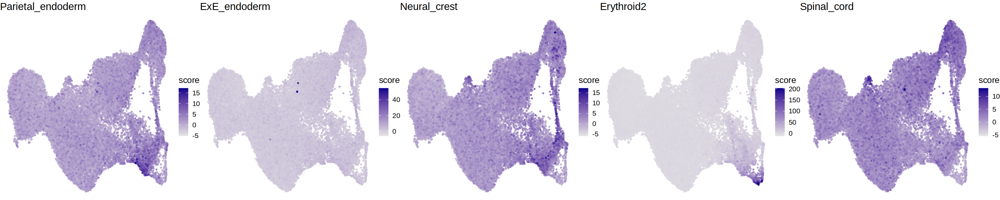

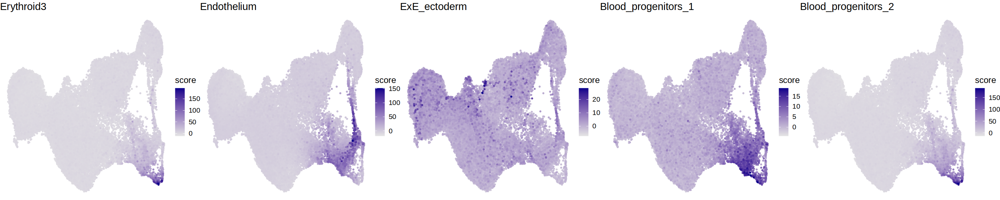

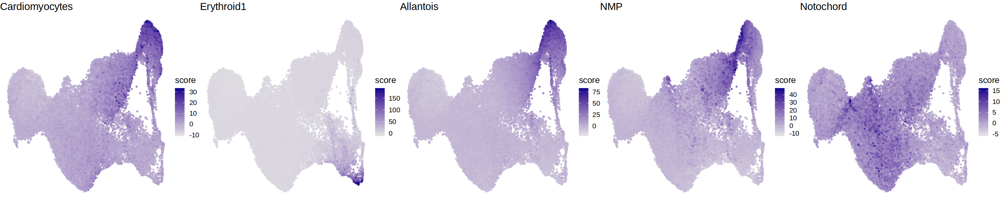

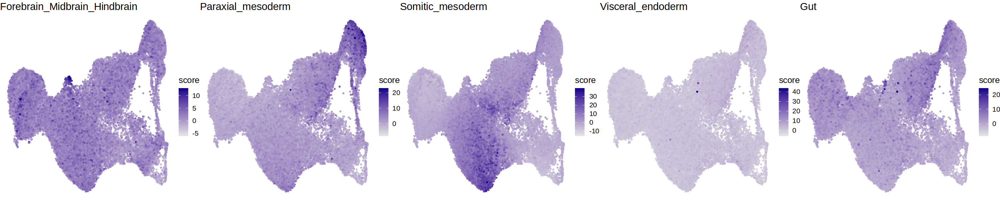

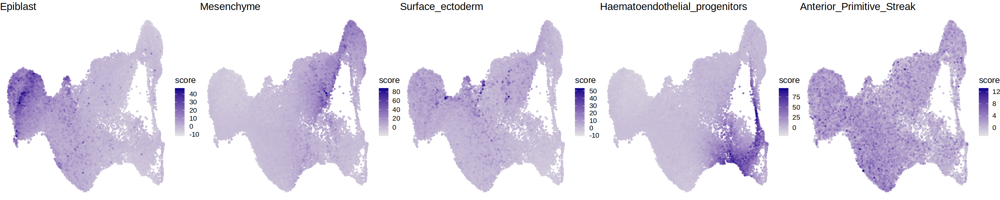

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

attr(,"class")
[1] "list"      "ggarrange"

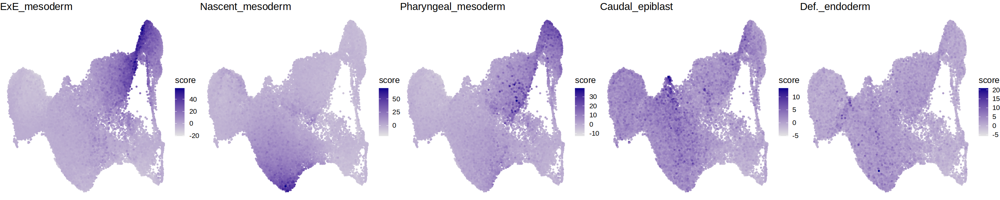

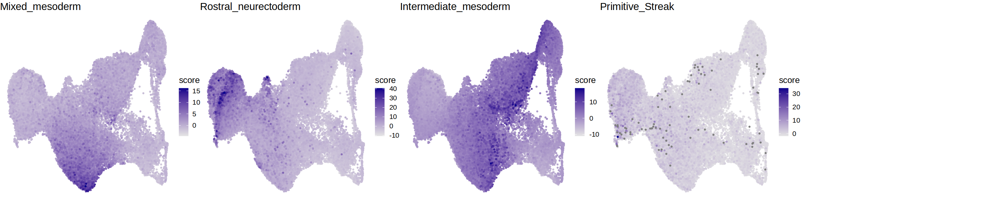

In [114]:
options(repr.plot.width=25, repr.plot.height=5)
ggarrange(plotlist=plots, ncol=5)